Arnav Pandey

IIIT Hyderabad

Accelerize360

Data Analysis and Visualization of NYC Taxi Rides

In [33]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from geopy import distance
from datetime import datetime
import folium
from folium.plugins import MarkerCluster

In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [5]:
# working with the train_csv given in the New York Taxi Trip Duration
# change the path to the location of the train.csv file 
df = pd.read_csv('/content/drive/MyDrive/train.csv', header=0, sep=',', quotechar='"')
df.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435


In [6]:
# Let us try to analyze the fields and the data trends present
def unique_values(col):
  return len(col.unique())
def find_nan(col):
  return col.isna().sum()

def describe_nyc(df):
  nyc_df = pd.DataFrame(index = df.columns)
  trends = df.describe(include = 'all').T
  trend_columns = ['min','max','mean','std']
  nyc_df['types'] = df.dtypes
  # find unique values in original train df
  nyc_df['unique_values'] = df.apply(unique_values)
  # find missing values in the columns
  nyc_df['Nan'] = df.apply(find_nan)
  nyc_df[trend_columns] = trends[trend_columns]

  return nyc_df



In [7]:
# change pickup and drop to datetime columns
desired_cols = ['pickup_datetime','dropoff_datetime']
df[desired_cols] = df[desired_cols].apply(pd.to_datetime)
describe_df = describe_nyc(df)
describe_df

,types,unique_values,Nan,min,max,mean,std
id,object,1458644,0,NaN,NaN,NaN,NaN
vendor_id,int64,2,0,1.0,2.0,1.53495,0.498777
pickup_datetime,datetime64[ns],1380222,0,2016-01-01 00:00:17,2016-06-30 23:59:39,2016-04-01 10:10:24.940037120,NaN
dropoff_datetime,datetime64[ns],1380377,0,2016-01-01 00:03:31,2016-07-01 23:02:03,2016-04-01 10:26:24.432310528,NaN
passenger_count,int64,10,0,0.0,9.0,1.66453,1.314242
pickup_longitude,float64,23047,0,-121.933342,-61.335529,-73.973486,0.070902
pickup_latitude,float64,45245,0,34.359695,51.881084,40.750921,0.032881
dropoff_longitude,float64,33821,0,-121.933304,-61.335529,-73.973416,0.070643
dropoff_latitude,float64,62519,0,32.181141,43.921028,40.7518,0.035891
store_and_fwd_flag,object,2,0,NaN,NaN,NaN,NaN


Data Types


1.   Converted pickup and dropoff to datetime objects for better manipulation.
2.   Coordinates are in the float format.
3. Converted vendor_id and trip_duration of integer formats



**Observations**


1.   We can see there are no missing values in any column present.
2.   Some interesting observations can be seen in the passenger count with *min* being 0 and *max* being 9 passengers in one taxi which seems to be odd.
3. Similar that longest trip recorded was 3526282 seconds which comes out to be aroun 40 days?? While the minimum being 1s?
4. The longitude/latitude columns seem to have interesting trends and their density can be analyzed by plotting these trends.
5. The pickup and drop times can give us good insights about the rush hours and peak traffic time.





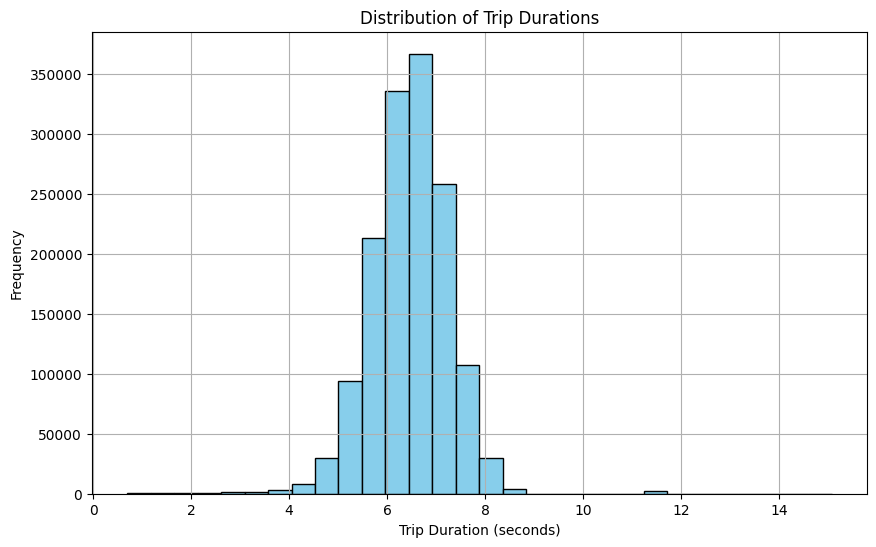

In [18]:
# let see the the distribution of the time taken for a trip
# in order to get a better understanding we will take the log distribution
trip_duration = np.log1p(df['trip_duration'].values)
plt.figure(figsize=(10,6))
plt.hist(trip_duration, bins=30, color='skyblue', edgecolor='black')
plt.title('Distribution of Trip Durations')
plt.xlabel('Trip Duration (seconds)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

As a large percentage of data was falling in a single bin we can use the log distribution of spread out the values and reduce skewness. Visualization becomes easier.  

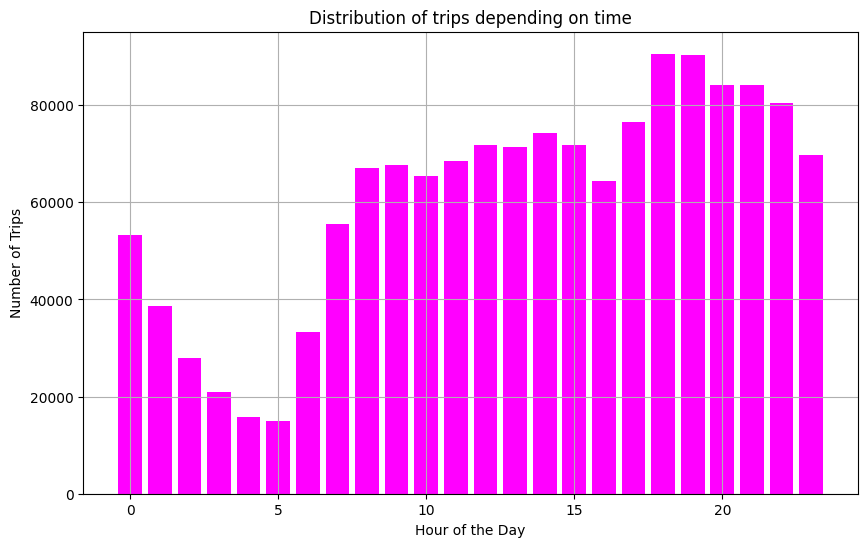

In [24]:
# Let us analyze the peak hours of NYC Taxi service
hourly_trips = df.groupby(df['pickup_datetime'].dt.hour).trip_duration.count().reset_index()
plt.figure(figsize=(10,6))
plt.bar(x = hourly_trips.pickup_datetime, height = hourly_trips.trip_duration, color = 'magenta')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Trips')
plt.title('Distribution of trips depending on time')
plt.grid(True)
plt.show()


We observe that the majority of trips commence between 6 PM and 9 PM in the evenings. This aligns well with typical office hours.

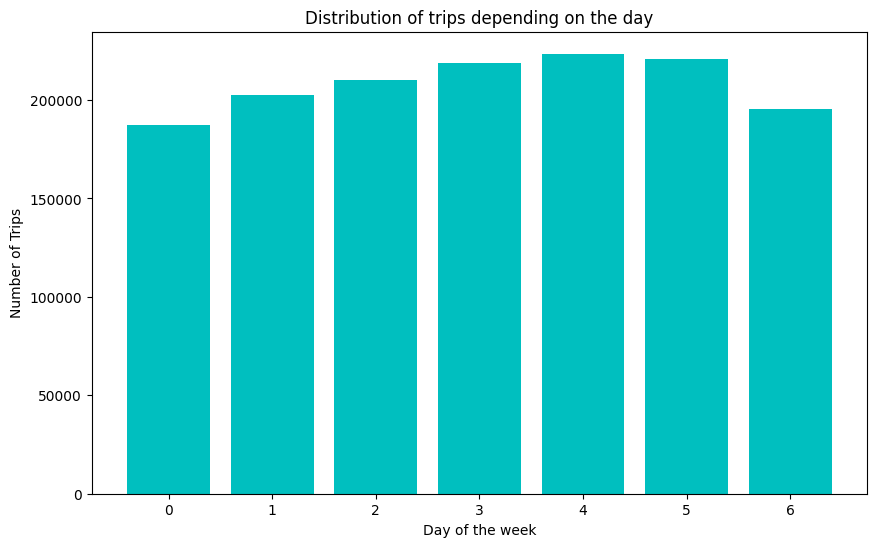

In [26]:
# SImilarly lets try to find which days are the busiest
daily_trips = df.groupby(df['pickup_datetime'].dt.dayofweek).trip_duration.count().reset_index()
plt.figure(figsize=(10,6))
plt.bar(x = daily_trips.pickup_datetime, height = daily_trips.trip_duration, color = 'c')
plt.xlabel('Day of the week')
plt.ylabel('Number of Trips')
plt.title('Distribution of trips depending on the day')
plt.show()

Weekend hits? People in NYC tend to travel more during the weekend

In [10]:
import plotly.express as px

# lets capture these trends in a lineplot for better understanding

trends = df.groupby([df.rename(columns={'pickup_datetime':'Hour'})['Hour'].dt.hour,df.rename(columns={'pickup_datetime':'Day'})['Day'].dt.day_name()]).trip_duration.count().reset_index()
trends.rename(columns={'trip_duration':'Count_trips'}, inplace=True)
# Convert to Plotly figure
fig = px.line(trends, x=trends.columns[0], y='Count_trips', color=trends.columns[1],
              labels={trends.columns[0]: 'Hour of the Day', 'Count_trips': 'Number of Trips', trends.columns[1]: 'Day'},
              title='Hour wise and Day wise Trips')
fig.show()

This interactive plot enables us to analyze line plots on both an hourly and daily basis. We can select and deselect lines as desired, allowing for easy comparison. An interesting observation is that on non-working days, there is a noticeable decrease in morning travel activity. This suggests that travel patterns vary depending on the day of the week.

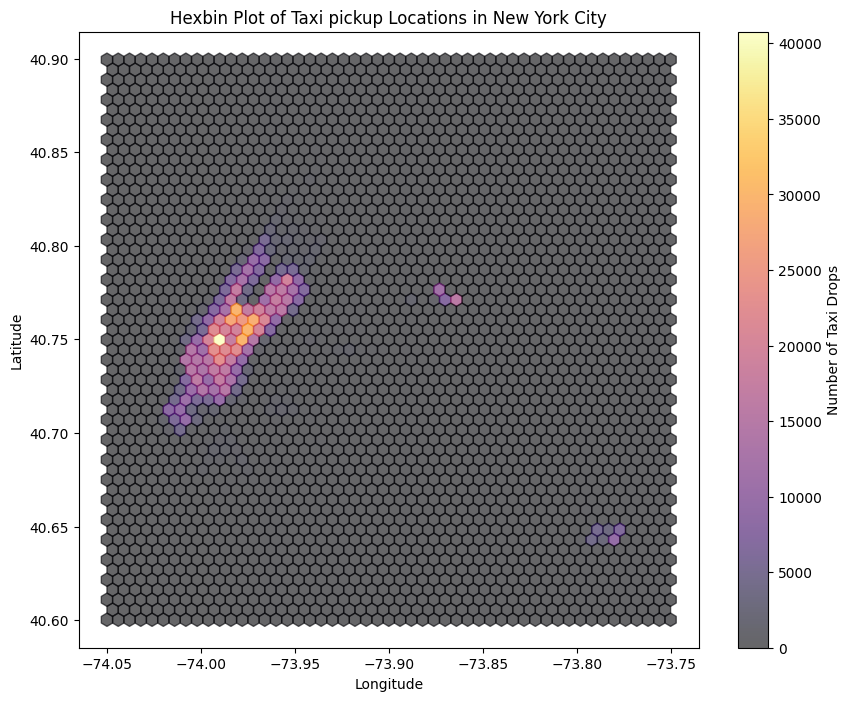

In [22]:
# Let us find the heatmap of the pickup locations

ny_lon_range = (-74.05, -73.75)
ny_lat_range = (40.6, 40.9)
ny_df = df[(df['pickup_longitude'].between(ny_lon_range[0], ny_lon_range[1])) &
           (df['pickup_latitude'].between(ny_lat_range[0], ny_lat_range[1]))]

# Create a hexbin plot of pickup latitudes and longitudes within the bounding box
plt.figure(figsize=(10, 8))
plt.hexbin(ny_df['pickup_longitude'], ny_df['pickup_latitude'], gridsize=50, cmap='inferno', alpha=0.6)
plt.colorbar(label='Number of Taxi Drops')
plt.title('Hexbin Plot of Taxi pickup Locations in New York City')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

Through this heatmap we can see which regions have a higher density of taxi pickup rides

In [23]:
west, south, east, north = -74.258259, 40.496748, -73.70, 40.913584

# Possible conditions regarding to pick and drop, setting in NYC locations
condition_pick_up_city = (df.pickup_latitude > south) & (df.pickup_latitude < north) & (df.pickup_longitude > west) & (df.pickup_longitude < east)
condition_pick_up_outside_city = (df.pickup_latitude < south) | (df.pickup_latitude > north) | (df.pickup_longitude < west) | (df.pickup_longitude > east)
condition_dropoff_city = (df.dropoff_latitude > south) & (df.dropoff_latitude < north) & (df.dropoff_longitude > west) & (df.dropoff_longitude < east)
condition_dropoff_outside_city = (df.dropoff_latitude < south) | (df.dropoff_latitude > north) | (df.dropoff_longitude < west) | (df.dropoff_longitude > east)

location_conditions = {'inside_city': condition_pick_up_city & condition_dropoff_city,
                      'inside_out': condition_pick_up_city & condition_dropoff_outside_city,
                      'outside_in': condition_pick_up_outside_city & condition_dropoff_city,
                      'outside_city': condition_pick_up_outside_city & condition_dropoff_outside_city}


In [25]:
temp = df[condition_pick_up_city&condition_dropoff_outside_city]
nyc_map = folium.Map(location =[41, -74.00] , zoom_start = 4)
for i in range(0,len(temp.dropna())):
        folium.Marker(
          location=[temp.dropna().iloc[i]['pickup_latitude'],temp.dropna().iloc[i]['pickup_longitude']],
          popup=temp.dropna().iloc[i]['id'],
       ).add_to(nyc_map)
nyc_map

Using Folium, we can plot these points on an actual map to visualize regions with higher taxi ride activity. An interesting observation from this graph is that when pickups occur within the city and dropoffs outside the city, it indicates significant travel from Manhattan. This suggests that people in Manhattan engage in a considerable amount of outbound travel.

In [32]:
df_sample = df.sample(n=50000, random_state=42)
df_sample = df_sample[(df_sample['pickup_latitude'] >= 39) & (df_sample['pickup_latitude'] <= 41) &
                     (df_sample['pickup_longitude'] >= -76) & (df_sample['pickup_longitude'] <= -72)]

# Create scatter plot using Plotly
fig = px.scatter_mapbox(df_sample, lat='pickup_latitude', lon='pickup_longitude', color_discrete_sequence=['blue'], zoom=10)
fig.add_scattermapbox(lat=df_sample['dropoff_latitude'], lon=df_sample['dropoff_longitude'], marker=dict(color='red'), mode='markers', name='Dropoff')
fig.add_scattermapbox(lat=df_sample['pickup_latitude'], lon=df_sample['pickup_longitude'], marker=dict(color='blue'), mode='markers', name='Pickup')
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(title='Scatter Plot of Pickup and Dropoff Locations in NYC', margin=dict(l=0, r=0, t=30, b=0))
fig.show()


This scatter plot visualizes the overlap between pickup and dropoff coordinates in NYC for a randomly sampled set of 50,000 rides. By using this interactive map, we can easily identify areas where pickups and dropoffs frequently coincide. This allows us to visually assess the degree of overlap between the two sets of coordinates.

In [36]:
df_sample = df.sample(n=50000, random_state=42)
df_sample = df_sample[(df_sample['pickup_latitude'] >= 39) & (df_sample['pickup_latitude'] <= 41) &
                     (df_sample['pickup_longitude'] >= -76) & (df_sample['pickup_longitude'] <= -72)]

# Create a DataFrame with additional columns for day and time
df_sample['day'] = df_sample['pickup_datetime'].dt.day_name()
df_sample['hour'] = df_sample['pickup_datetime'].dt.hour

# Create scatter plot using Plotly with dropdown menus for day and hour
fig = px.scatter_mapbox(df_sample, lat='pickup_latitude', lon='pickup_longitude', color_discrete_sequence=['blue'], zoom=10,
                        animation_frame='day', animation_group='hour', category_orders={'day': ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']},
                        labels={'day': 'Day of the Week', 'hour': 'Hour of the Day'})
fig.add_scattermapbox(lat=df_sample['dropoff_latitude'], lon=df_sample['dropoff_longitude'], marker=dict(color='red'), mode='markers', name='Dropoff')
fig.add_scattermapbox(lat=df_sample['pickup_latitude'], lon=df_sample['pickup_longitude'], marker=dict(color='blue'), mode='markers', name='Pickup')
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(title='Scatter Plot of Pickup and Dropoff Locations in NYC by Day and Hour', margin=dict(l=0, r=0, t=30, b=0))
fig.show()


This is an interactive plot that can show us the density changes day-wise, similarly the plot below changes time-wise

In [37]:
df_sample = df.sample(n=50000, random_state=42)
df_sample = df_sample[(df_sample['pickup_latitude'] >= 39) & (df_sample['pickup_latitude'] <= 41) &
                     (df_sample['pickup_longitude'] >= -76) & (df_sample['pickup_longitude'] <= -72)]

# Create a DataFrame with additional columns for day and time
df_sample['day'] = df_sample['pickup_datetime'].dt.day_name()
df_sample['hour'] = df_sample['pickup_datetime'].dt.hour

# Create scatter plot using Plotly with dropdown menus for day and time
fig = px.scatter_mapbox(df_sample, lat='pickup_latitude', lon='pickup_longitude', color_discrete_sequence=['blue'], zoom=10,
                        animation_frame='hour', animation_group='day', category_orders={'day': ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']},
                        labels={'day': 'Day of the Week', 'hour': 'Hour of the Day'})
fig.add_scattermapbox(lat=df_sample['dropoff_latitude'], lon=df_sample['dropoff_longitude'], marker=dict(color='red'), mode='markers', name='Dropoff')
fig.add_scattermapbox(lat=df_sample['pickup_latitude'], lon=df_sample['pickup_longitude'], marker=dict(color='blue'), mode='markers', name='Pickup')
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(title='Scatter Plot of Pickup and Dropoff Locations in NYC by Day and Time', margin=dict(l=0, r=0, t=30, b=0))
fig.show()
